In [2]:
import pandas as pd 
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns 
import numpy as np

from sklearn.preprocessing import OneHotEncoder     #encode categorical features as a one-hot numeric array.
from sklearn.preprocessing import StandardScaler    #brings magnitudes to the same scale, prevents bias towards a specific feature

from sklearn.cluster import KMeans     #k-means algorithm   
from collections import Counter        #get the size of the K-Means clusters 
from kneed import KneeLocator


#from sklearn.cluster import AgglomerativeClustering
#from scipy.cluster import hierarchy
#from scipy.cluster.hierarchy import dendrogram, linkage
#from scipy.cluster.hierarchy import fcluster     # extract a specific number of clusters

#from sklearn.metrics import silhouette_score #silhoutte score, evaluate the quality of a clustering algorithm 


import matplotlib.dates as mdates

print("Setup Complete")

Setup Complete


In [3]:
pd.set_option('display.max_columns', None)

In [4]:
locals_data =pd.read_csv("C:/Users/mnino/Documents/DataScience/IT Academy/ProvaTecnica_Data_Science/220930_censcomercialbcn_opendata_2022_v10_mod.csv", sep=",",index_col="ID_Global")

C:\Users\mnino\AppData\Local\Temp\ipykernel_5980\1895457323.py:1: DtypeWarning: Columns (21) have mixed types. Specify dtype option on import or set low_memory=False.
  locals_data =pd.read_csv("C:/Users/mnino/Documents/DataScience/IT Academy/ProvaTecnica_Data_Science/220930_censcomercialbcn_opendata_2022_v10_mod.csv", sep=",",index_col="ID_Global")


In [5]:
locals_data.head(3)

,ID_Bcn_2016,Codi_Principal_Activitat,Nom_Principal_Activitat,Codi_Sector_Activitat,Nom_Sector_Activitat,Codi_Grup_Activitat,Nom_Grup_Activitat,Codi_Activitat_2022,Nom_Activitat,Codi_Activitat_2016,Nom_Local,SN_Oci_Nocturn,SN_Coworking,SN_Servei_Degustacio,SN_Obert24h,SN_Mixtura,SN_Carrer,SN_Mercat,Nom_Mercat,SN_Galeria,Nom_Galeria,SN_CComercial,Nom_CComercial,SN_Eix,Nom_Eix,X_UTM_ETRS89,Y_UTM_ETRS89,Latitud,Longitud,Direccio_Unica,Codi_Via,Nom_Via,Planta,Porta,Num_Policia_Inicial,Lletra_Inicial,Num_Policia_Final,Lletra_Final,Solar,Codi_Parcela,Codi_Illa,Seccio_Censal,Codi_Barri,Nom_Barri,Codi_Districte,Nom_Districte,Referencia_Cadastral,Data_Revisio
ID_Global,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2577e29a-b8d7-41f9-b751-49507d679c94,53938.0,1,Actiu,2,Serveis,16,Altres,1600102,Activitats emmagatzematge,1600102,SN,No,No,No,No,No,Sí,No,NaN,No,NaN,No,NaN,No,NaN,432177.016601,4.587066e+06,41.432302,2.188235,"000306, 20-20, LOC 10",306,ABAT ODÓ,LOC,10.0,20.0,NaN,20.0,NaN,574888.0,32.0,92670.0,47,60,Sant Andreu,9,Sant Andreu,2272432DF3827C,2021-06-22
a2463c00-b817-408f-ad31-cf32c08ca00a,53941.0,1,Actiu,2,Serveis,9,Ensenyament,9000000,Ensenyament,9000,Escacs,No,No,No,No,No,Sí,No,NaN,No,NaN,No,NaN,No,NaN,432162.042588,4.587068e+06,41.432317,2.188055,"000306, 22-22, LOC 10",306,ABAT ODÓ,LOC,10.0,22.0,NaN,22.0,NaN,159607.0,22.0,92670.0,47,60,Sant Andreu,9,Sant Andreu,2272422DF3827C,2021-06-22
47706876-da40-4fc8-b1dd-03730ca86205,53918.0,1,Actiu,2,Serveis,16,Altres,1600400,Serveis a les empreses i oficines,16004,MERITXELL VALLS ADVOCADA,No,No,No,No,No,Sí,No,NaN,No,NaN,No,NaN,No,NaN,432171.431947,4.587056e+06,41.432212,2.188169,"000306, 23B-25B, LOC 20",306,ABAT ODÓ,LOC,20.0,23.0,B,25.0,B,307364.0,8.0,92663.0,47,60,Sant Andreu,9,Sant Andreu,2272908DF3827A,2021-06-22


In [6]:
# total rows 66088, total colums 49
locals_data.shape

(66088, 48)

In [7]:
# check data types 
locals_data.dtypes

ID_Bcn_2016                 float64
Codi_Principal_Activitat      int64
Nom_Principal_Activitat      object
Codi_Sector_Activitat         int64
Nom_Sector_Activitat         object
Codi_Grup_Activitat           int64
Nom_Grup_Activitat           object
Codi_Activitat_2022           int64
Nom_Activitat                object
Codi_Activitat_2016          object
Nom_Local                    object
SN_Oci_Nocturn               object
SN_Coworking                 object
SN_Servei_Degustacio         object
SN_Obert24h                  object
SN_Mixtura                   object
SN_Carrer                    object
SN_Mercat                    object
Nom_Mercat                   object
SN_Galeria                   object
Nom_Galeria                  object
SN_CComercial                object
Nom_CComercial               object
SN_Eix                       object
Nom_Eix                      object
X_UTM_ETRS89                float64
Y_UTM_ETRS89                float64
Latitud                     

We observe that the variable/ attribute *Data_Revisio* is an object. We should convert it to a datetime

In [8]:
locals_data['Data_Revisio'] = pd.to_datetime(locals_data['Data_Revisio'].str.strip())


In [9]:
# find year that the business space was checked for last time 

locals_data['Any_Revisio']= locals_data['Data_Revisio'].dt.year

In [10]:
locals_data.groupby(['Any_Revisio'])["Codi_Principal_Activitat"].value_counts(dropna=False)

# 1 business space is active
# 0 business space is not active

Any_Revisio  Codi_Principal_Activitat
2019         1                             504
             0                               8
2021         1                           36081
             0                            4424
2022         1                           22323
             0                            2748
Name: count, dtype: int64

We can observe that the majority of the business space where reviewed in 2022 and 2021. Let's take only the most recent data from 2022. 

In [11]:
filt_any_revisio = (locals_data["Any_Revisio"] == 2022)


In [12]:
locals_data_updated = locals_data[filt_any_revisio].copy()

In [13]:
# check for missing values
locals_data_updated.isna().sum()

ID_Bcn_2016                  5122
Codi_Principal_Activitat        0
Nom_Principal_Activitat         0
Codi_Sector_Activitat           0
Nom_Sector_Activitat            0
Codi_Grup_Activitat             0
Nom_Grup_Activitat              0
Codi_Activitat_2022             0
Nom_Activitat                   0
Codi_Activitat_2016             0
Nom_Local                       0
SN_Oci_Nocturn                  0
SN_Coworking                    0
SN_Servei_Degustacio            0
SN_Obert24h                     0
SN_Mixtura                      0
SN_Carrer                       0
SN_Mercat                       0
Nom_Mercat                  23032
SN_Galeria                      0
Nom_Galeria                 24952
SN_CComercial                   0
Nom_CComercial              24249
SN_Eix                          0
Nom_Eix                     23343
X_UTM_ETRS89                    0
Y_UTM_ETRS89                    0
Latitud                         0
Longitud                        0
Direccio_Unica

After some exploration of the missing values in *Nom_Mercat*, we can confirm that it makes sense since the total number of businesses that are not inside a market *SN_Mercat* is the same (63537). Same logic applies for *Nom_Galeria*, *Nom_CComercial*, *Nom_Eix*. 

In [14]:
locals_data_updated["SN_Mercat"].value_counts(dropna=False)

SN_Mercat
No    23032
Sí     2039
Name: count, dtype: int64

In [15]:
locals_data_updated["Nom_Mercat"].value_counts(dropna=False)

Nom_Mercat
NaN                  23032
Boqueria               249
Galvany                109
Hostafrancs             95
Santa Caterina          84
Ninot                   83
Mercè                   73
Sant Antoni             72
Concepció               70
Abaceria (PROV)         68
Carmel                  68
Horta                   64
Sants                   61
Estrella                60
Llibertat               51
Montserrat              50
Felip II                50
Sagrada Família         47
Provençals              45
Clot                    43
Les Corts               43
Barceloneta             42
Besòs                   40
Sant Martí              39
La Marina               37
Lesseps                 35
Sarrià                  34
Poblenou-Unió           33
Guineueta               29
Sant Gervasi            27
Canyelles               27
Sant Andreu(PROV)       25
Vall d'Hebron           24
Fort Pienc              24
Trinitat                22
Tres Torres             19
Guinardó         

After verifying each variable, we can drop down the following columns. 
- *ID_Bcn_2016* and *Codi_Activitat_2016*, old information.

- *X_UTM_ETRS89*, *Y_UTM_ETRS89*, *Direccio_Unica*;  we're going to use *Latitude* and *Longitude*.instead. 
- *Nom_Via*, we're going to use *Codi_Via*.
- *Planta*, there's only one unique value "LOC".
- *Porta*.
- *Num_Policia_Inicial*.
- *Lletra_Inicial*.
- *Num_Policia_Final*.
- *Lletra_Final*.
- *Codi_Parcela*.
- *Codi_Illa*.
- *Seccio_Censal*.
- *Nom_Barri*, we can use *Codi_Barri* instead. 
- *Nom_Districte*, we can use *Codi_Districte* instead. 
- *Referencia_Cadastral*.
- *Data_Revisio*. 



In [16]:
locals_data_updated.drop(columns=["ID_Bcn_2016", "Codi_Activitat_2016", "Nom_Mercat", "Nom_Galeria", 
                        "X_UTM_ETRS89", "Y_UTM_ETRS89","Direccio_Unica", "Nom_CComercial", "Nom_Eix", 
                        "Nom_Via", "Planta", "Porta", "Num_Policia_Inicial",
                        "Lletra_Inicial", "Num_Policia_Final", "Lletra_Final", 
                        "Codi_Parcela", "Codi_Illa", "Seccio_Censal", "Nom_Barri", 
                        "Nom_Districte", "Referencia_Cadastral", "Solar", "Data_Revisio", 
                        "Any_Revisio", "Codi_Activitat_2022"], axis=1, inplace=True)

In [17]:
locals_data_updated.head(3)

,Codi_Principal_Activitat,Nom_Principal_Activitat,Codi_Sector_Activitat,Nom_Sector_Activitat,Codi_Grup_Activitat,Nom_Grup_Activitat,Nom_Activitat,Nom_Local,SN_Oci_Nocturn,SN_Coworking,SN_Servei_Degustacio,SN_Obert24h,SN_Mixtura,SN_Carrer,SN_Mercat,SN_Galeria,SN_CComercial,SN_Eix,Latitud,Longitud,Codi_Via,Codi_Barri,Codi_Districte
ID_Global,,,,,,,,,,,,,,,,,,,,,,,
cd2223b1-0ad6-4717-9f92-16ff8de8fa66,1,Actiu,2,Serveis,14,"Restaurants, bars i hotels (Inclòs hostals, pe...",Restaurants,EL JARDI DE L'ABADESSA,No,No,No,No,No,Sí,No,No,No,No,41.394136,2.109836,601,21,4
f3e7da5a-1fb2-40c1-9f70-2d4cdcffe963,1,Actiu,1,Comerç al detall,1,Quotidià alimentari,Autoservei / Supermercat,SUPERMERCAT FAIZAN,No,No,No,No,No,Sí,No,No,No,No,41.412337,2.164618,805,33,7
4a793b3c-735a-4031-9ab0-d20e7aad83ec,1,Actiu,2,Serveis,16,Altres,Serveis a les empreses i oficines,CCIES,No,No,No,No,No,Sí,No,No,No,No,41.384693,2.108408,1105,21,4


In [18]:
locals_data_updated.isna().sum()

Codi_Principal_Activitat    0
Nom_Principal_Activitat     0
Codi_Sector_Activitat       0
Nom_Sector_Activitat        0
Codi_Grup_Activitat         0
Nom_Grup_Activitat          0
Nom_Activitat               0
Nom_Local                   0
SN_Oci_Nocturn              0
SN_Coworking                0
SN_Servei_Degustacio        0
SN_Obert24h                 0
SN_Mixtura                  0
SN_Carrer                   0
SN_Mercat                   0
SN_Galeria                  0
SN_CComercial               0
SN_Eix                      0
Latitud                     0
Longitud                    0
Codi_Via                    0
Codi_Barri                  0
Codi_Districte              0
dtype: int64

One-hot encoding

In [19]:
# category column names
cat_cols = locals_data_updated.select_dtypes(include=["object"]).columns

In [20]:
cat_cols

Index(['Nom_Principal_Activitat', 'Nom_Sector_Activitat', 'Nom_Grup_Activitat',
       'Nom_Activitat', 'Nom_Local', 'SN_Oci_Nocturn', 'SN_Coworking',
       'SN_Servei_Degustacio', 'SN_Obert24h', 'SN_Mixtura', 'SN_Carrer',
       'SN_Mercat', 'SN_Galeria', 'SN_CComercial', 'SN_Eix'],
      dtype='object')

In [21]:
# Create an instance of OneHotEncoder
encoder = OneHotEncoder(sparse=False)

In [22]:
# Fit and transform the dataset using the encoder

cat_cols_encoded = encoder.fit_transform(locals_data_updated[cat_cols])

c:\ProgramData\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [23]:
# Get the feature names from the encoder and create a new dataframe
feature_names = encoder.get_feature_names_out(cat_cols)

feature_names

array(['Nom_Principal_Activitat_Actiu',
       'Nom_Principal_Activitat_Sense activitat Econòmica',
       'Nom_Sector_Activitat_Altres', ..., 'SN_CComercial_Sí',
       'SN_Eix_No', 'SN_Eix_Sí'], dtype=object)

In [24]:
# Get the feature names from the encoder and create a new dataframe

encoded_cols = pd.DataFrame(data=cat_cols_encoded, columns=feature_names)

In [25]:
# Reset the index labels of encoded_cols
encoded_cols.index = locals_data_updated.index

In [26]:
# Concatenate the original dataframe with the encoded dataframe
locals_data_updated_prd = pd.concat([locals_data_updated.copy(), encoded_cols], axis=1)


In [27]:
locals_data_updated_prd.dtypes

Codi_Principal_Activitat      int64
Nom_Principal_Activitat      object
Codi_Sector_Activitat         int64
Nom_Sector_Activitat         object
Codi_Grup_Activitat           int64
                             ...   
SN_Galeria_Sí               float64
SN_CComercial_No            float64
SN_CComercial_Sí            float64
SN_Eix_No                   float64
SN_Eix_Sí                   float64
Length: 17290, dtype: object

In [28]:
#Let's drop all non-numerical columns, ML algorithms only understand numbers.

non_num_cols = locals_data_updated_prd.select_dtypes(include=["object","category", "datetime64"]).columns

In [29]:
locals_data_updated_prd.drop(columns=non_num_cols, axis=1, inplace=True)

In [30]:
# see new columns that are one hot encoded 
locals_data_updated_prd.head(3)

,Codi_Principal_Activitat,Codi_Sector_Activitat,Codi_Grup_Activitat,Latitud,Longitud,Codi_Via,Codi_Barri,Codi_Districte,Nom_Principal_Activitat_Actiu,Nom_Principal_Activitat_Sense activitat Econòmica,Nom_Sector_Activitat_Altres,Nom_Sector_Activitat_Comerç al detall,Nom_Sector_Activitat_Comerç al detall /Engròs,Nom_Sector_Activitat_Locals buits en lloguer,Nom_Sector_Activitat_Locals buits en venda,Nom_Sector_Activitat_Locals buits en venda i lloguer,Nom_Sector_Activitat_Serveis,Nom_Grup_Activitat_Activitats immobiliàries,Nom_Grup_Activitat_Altres,Nom_Grup_Activitat_Automoció,Nom_Grup_Activitat_Ensenyament,Nom_Grup_Activitat_Equipament personal,Nom_Grup_Activitat_Equipaments culturals i recreatius,Nom_Grup_Activitat_Finances i assegurances,Nom_Grup_Activitat_Grup no definit,"Nom_Grup_Activitat_Manteniment, neteja i producció",Nom_Grup_Activitat_Oci i cultura,Nom_Grup_Activitat_Parament de la llar,Nom_Grup_Activitat_Quotidià alimentari,Nom_Grup_Activitat_Quotidià no alimentari,Nom_Grup_Activitat_Reparacions (Electrodomèstics i automòbils),"Nom_Grup_Activitat_Restaurants, bars i hotels (Inclòs hostals, pensions i fondes)",Nom_Grup_Activitat_Sanitat i assistència,Nom_Activitat_Activitats de la construcció,Nom_Activitat_Activitats de transport,Nom_Activitat_Activitats emmagatzematge,Nom_Activitat_Activitats immobiliàries,Nom_Activitat_Activitats industrials,Nom_Activitat_Administració,Nom_Activitat_Agències de viatge,Nom_Activitat_Altres,Nom_Activitat_Altres ( per exemple VENDING),Nom_Activitat_Altres equipaments esportius,Nom_Activitat_Aparells domèstics,Nom_Activitat_Arranjaments,Nom_Activitat_Arts gràfiques,Nom_Activitat_Associacions,Nom_Activitat_Autoservei / Supermercat,Nom_Activitat_Bars / CIBERCAFÈ,Nom_Activitat_Bars especials amb actuació / Bars musicals / Discoteques /PUB,Nom_Activitat_Basars,Nom_Activitat_Begudes,Nom_Activitat_Calçat i pell,Nom_Activitat_Carn i Porc,Nom_Activitat_Centres d'estètica,Nom_Activitat_Combustibles i carburants,Nom_Activitat_Drogueria i perfumeria,Nom_Activitat_Ensenyament,Nom_Activitat_Equipaments culturals i recreatius,Nom_Activitat_Equipaments religiosos,Nom_Activitat_Fabricació tèxtil,Nom_Activitat_Farmàcies PARAFARMÀCIA,Nom_Activitat_Finances i assegurances,Nom_Activitat_Floristeries,Nom_Activitat_Fotografia,Nom_Activitat_Fruites i verdures,Nom_Activitat_Gimnàs /fitnes,Nom_Activitat_Grans magatzems i hipermercats,"Nom_Activitat_Herbolaris, dietètica i NUTRICIÓ",Nom_Activitat_Informàtica,Nom_Activitat_Joguines i esports,"Nom_Activitat_Joieria, rellotgeria i bijuteria","Nom_Activitat_Llibres, diaris i revistes",Nom_Activitat_Locals buits en lloguer,Nom_Activitat_Locals buits en venda,Nom_Activitat_Locals buits en venda i lloguer,Nom_Activitat_Locals buits en venda i lloguer – reanalisi,Nom_Activitat_Locutoris,"Nom_Activitat_Manteniment, neteja i similars",Nom_Activitat_Maquinària,Nom_Activitat_Material equipament llar,Nom_Activitat_Merceria,Nom_Activitat_Mobles i articles fusta i metall,Nom_Activitat_Música,Nom_Activitat_Ous i aus,"Nom_Activitat_Pa, pastisseria i làctics",Nom_Activitat_Parament ferreteria,Nom_Activitat_Peix i marisc,Nom_Activitat_Perruqueries,Nom_Activitat_Plats preparats (no degustació),Nom_Activitat_Pàrquings i garatges,Nom_Activitat_Reparacions (Electrodomèstics i automòbils),Nom_Activitat_Restaurants,Nom_Activitat_Sanitat i assistència,"Nom_Activitat_Segells, monedes i antiguitats",Nom_Activitat_Serveis Socials,Nom_Activitat_Serveis a les empreses i oficines,Nom_Activitat_Serveis de menjar take away MENJAR RÀPID,Nom_Activitat_Serveis de telecomunicacions,Nom_Activitat_Souvenirs,Nom_Activitat_Tabac i articles fumadors,Nom_Activitat_Tintoreries,Nom_Activitat_Vehicles,Nom_Activitat_Vestir,Nom_Activitat_Veterinaris / Mascotes,Nom_Activitat_Xocolateries / Geladeries / Degustació,Nom_Activitat_altres,Nom_Activitat_serveis d'allotjament,Nom_Activitat_serveis de menjar i begudes,Nom_Activitat_Òptiques,"Nom_Local_""CRUÏLLA AL PUNT"" ESCOLA DE CUINA I BAR-RESTAURANT",Nom_Local_# PIZ

In [31]:
# create an instance of the StandardScaler
scaler = StandardScaler()

In [32]:
# calculate parameters and transform
stand_data = scaler.fit_transform(locals_data_updated_prd)

In [33]:
stand_data

array([[ 0.35085857,  0.18029717,  0.72099224, ..., -0.18411492,
         0.27207807, -0.27207807],
       [ 0.35085857, -1.22568429, -1.2235479 , ..., -0.18411492,
         0.27207807, -0.27207807],
       [ 0.35085857,  0.18029717,  1.02015226, ..., -0.18411492,
         0.27207807, -0.27207807],
       ...,
       [ 0.35085857,  0.18029717, -0.02690782, ..., -0.18411492,
         0.27207807, -0.27207807],
       [ 0.35085857,  0.18029717,  0.72099224, ..., -0.18411492,
         0.27207807, -0.27207807],
       [ 0.35085857,  1.58627863,  1.16973227, ..., -0.18411492,
         0.27207807, -0.27207807]])

In [34]:
# create a df of scaled data

scaled_locals_data = pd.DataFrame(data=stand_data, index=locals_data_updated_prd.index, columns=locals_data_updated_prd.columns)

In [35]:
scaled_locals_data.columns

Index(['Codi_Principal_Activitat', 'Codi_Sector_Activitat',
       'Codi_Grup_Activitat', 'Latitud', 'Longitud', 'Codi_Via', 'Codi_Barri',
       'Codi_Districte', 'Nom_Principal_Activitat_Actiu',
       'Nom_Principal_Activitat_Sense activitat Econòmica',
       ...
       'SN_Carrer_No', 'SN_Carrer_Sí', 'SN_Mercat_No', 'SN_Mercat_Sí',
       'SN_Galeria_No', 'SN_Galeria_Sí', 'SN_CComercial_No',
       'SN_CComercial_Sí', 'SN_Eix_No', 'SN_Eix_Sí'],
      dtype='object', length=17275)

In [36]:
## K-Means
# Choosing the Appropriate Number of Clusters

kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_locals_data)
    sse.append(kmeans.inertia_)

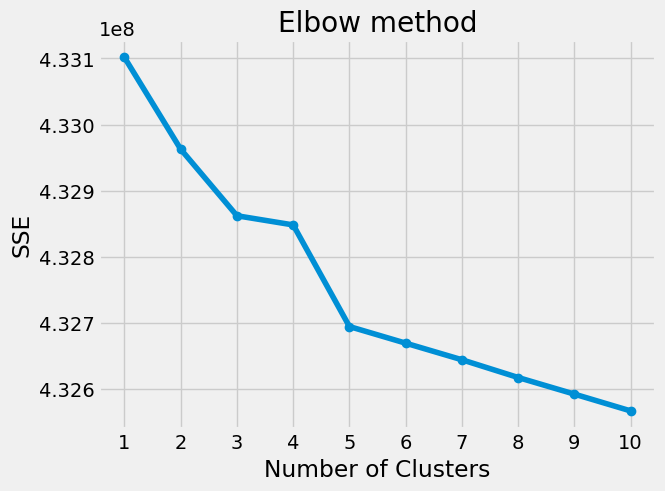

In [37]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse, marker = "o")
plt.xticks(range(1, 11))
plt.title('Elbow method')
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [38]:
kl = KneeLocator(
    range(1, 11), sse, curve="convex", direction="decreasing"
)

kl.elbow

5

We choose n_clusters=**5**

In [39]:
# The scikit-learn algorithm is repeated 10 times by default (n_init)
# The argument max_iter (default 300) can be used to control the number of iterations

kmeans = KMeans(n_clusters=5, ).fit(scaled_locals_data)

c:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


#### Cluster labels

In [40]:
# create a column that includes cluster labels 
scaled_locals_data["cluster_label"] = kmeans.labels_

In [42]:
scaled_locals_data.head(3)

,Codi_Principal_Activitat,Codi_Sector_Activitat,Codi_Grup_Activitat,Latitud,Longitud,Codi_Via,Codi_Barri,Codi_Districte,Nom_Principal_Activitat_Actiu,Nom_Principal_Activitat_Sense activitat Econòmica,Nom_Sector_Activitat_Altres,Nom_Sector_Activitat_Comerç al detall,Nom_Sector_Activitat_Comerç al detall /Engròs,Nom_Sector_Activitat_Locals buits en lloguer,Nom_Sector_Activitat_Locals buits en venda,Nom_Sector_Activitat_Locals buits en venda i lloguer,Nom_Sector_Activitat_Serveis,Nom_Grup_Activitat_Activitats immobiliàries,Nom_Grup_Activitat_Altres,Nom_Grup_Activitat_Automoció,Nom_Grup_Activitat_Ensenyament,Nom_Grup_Activitat_Equipament personal,Nom_Grup_Activitat_Equipaments culturals i recreatius,Nom_Grup_Activitat_Finances i assegurances,Nom_Grup_Activitat_Grup no definit,"Nom_Grup_Activitat_Manteniment, neteja i producció",Nom_Grup_Activitat_Oci i cultura,Nom_Grup_Activitat_Parament de la llar,Nom_Grup_Activitat_Quotidià alimentari,Nom_Grup_Activitat_Quotidià no alimentari,Nom_Grup_Activitat_Reparacions (Electrodomèstics i automòbils),"Nom_Grup_Activitat_Restaurants, bars i hotels (Inclòs hostals, pensions i fondes)",Nom_Grup_Activitat_Sanitat i assistència,Nom_Activitat_Activitats de la construcció,Nom_Activitat_Activitats de transport,Nom_Activitat_Activitats emmagatzematge,Nom_Activitat_Activitats immobiliàries,Nom_Activitat_Activitats industrials,Nom_Activitat_Administració,Nom_Activitat_Agències de viatge,Nom_Activitat_Altres,Nom_Activitat_Altres ( per exemple VENDING),Nom_Activitat_Altres equipaments esportius,Nom_Activitat_Aparells domèstics,Nom_Activitat_Arranjaments,Nom_Activitat_Arts gràfiques,Nom_Activitat_Associacions,Nom_Activitat_Autoservei / Supermercat,Nom_Activitat_Bars / CIBERCAFÈ,Nom_Activitat_Bars especials amb actuació / Bars musicals / Discoteques /PUB,Nom_Activitat_Basars,Nom_Activitat_Begudes,Nom_Activitat_Calçat i pell,Nom_Activitat_Carn i Porc,Nom_Activitat_Centres d'estètica,Nom_Activitat_Combustibles i carburants,Nom_Activitat_Drogueria i perfumeria,Nom_Activitat_Ensenyament,Nom_Activitat_Equipaments culturals i recreatius,Nom_Activitat_Equipaments religiosos,Nom_Activitat_Fabricació tèxtil,Nom_Activitat_Farmàcies PARAFARMÀCIA,Nom_Activitat_Finances i assegurances,Nom_Activitat_Floristeries,Nom_Activitat_Fotografia,Nom_Activitat_Fruites i verdures,Nom_Activitat_Gimnàs /fitnes,Nom_Activitat_Grans magatzems i hipermercats,"Nom_Activitat_Herbolaris, dietètica i NUTRICIÓ",Nom_Activitat_Informàtica,Nom_Activitat_Joguines i esports,"Nom_Activitat_Joieria, rellotgeria i bijuteria","Nom_Activitat_Llibres, diaris i revistes",Nom_Activitat_Locals buits en lloguer,Nom_Activitat_Locals buits en venda,Nom_Activitat_Locals buits en venda i lloguer,Nom_Activitat_Locals buits en venda i lloguer – reanalisi,Nom_Activitat_Locutoris,"Nom_Activitat_Manteniment, neteja i similars",Nom_Activitat_Maquinària,Nom_Activitat_Material equipament llar,Nom_Activitat_Merceria,Nom_Activitat_Mobles i articles fusta i metall,Nom_Activitat_Música,Nom_Activitat_Ous i aus,"Nom_Activitat_Pa, pastisseria i làctics",Nom_Activitat_Parament ferreteria,Nom_Activitat_Peix i marisc,Nom_Activitat_Perruqueries,Nom_Activitat_Plats preparats (no degustació),Nom_Activitat_Pàrquings i garatges,Nom_Activitat_Reparacions (Electrodomèstics i automòbils),Nom_Activitat_Restaurants,Nom_Activitat_Sanitat i assistència,"Nom_Activitat_Segells, monedes i antiguitats",Nom_Activitat_Serveis Socials,Nom_Activitat_Serveis a les empreses i oficines,Nom_Activitat_Serveis de menjar take away MENJAR RÀPID,Nom_Activitat_Serveis de telecomunicacions,Nom_Activitat_Souvenirs,Nom_Activitat_Tabac i articles fumadors,Nom_Activitat_Tintoreries,Nom_Activitat_Vehicles,Nom_Activitat_Vestir,Nom_Activitat_Veterinaris / Mascotes,Nom_Activitat_Xocolateries / Geladeries / Degustació,Nom_Activitat_altres,Nom_Activitat_serveis d'allotjament,Nom_Activitat_serveis de menjar i begudes,Nom_Activitat_Òptiques,"Nom_Local_""CRUÏLLA AL PUNT"" ESCOLA DE CUINA I BAR-RESTAURANT",Nom_Local_# PIZ

#### Cluster means (centroids)

In [43]:
# The means of the clusters (cluster centers) are also returned
# number of columns: scaled_fb_data.columns[:-1] 

centers = pd.DataFrame(kmeans.cluster_centers_, columns=scaled_locals_data.columns[:-1])

#### Interpreting the Clusters

The two most important outputs from kmeans are the sizes of the clusters and the cluster means.

In [44]:
Counter(kmeans.labels_)

Counter({4: 16674, 0: 4173, 1: 2724, 3: 820, 2: 680})

In [45]:
from sklearn.decomposition import PCA

In [47]:
pca = PCA(n_components=2)

locals_pca = pca.fit_transform(scaled_locals_data)

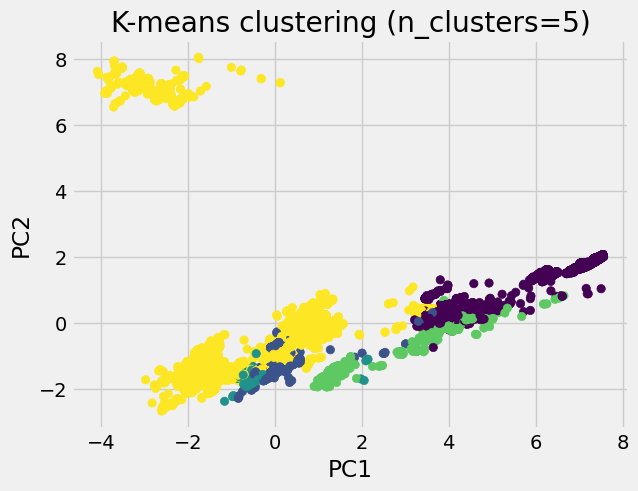

In [48]:
plt.scatter(locals_pca[:, 0], locals_pca[:, 1], c=kmeans.labels_)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('K-means clustering (n_clusters=5)')
plt.show()